# Kaggle dog breed identification 

## Download data form kaggle, store and import

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Getting our workspace ready

In [2]:
# Import Tensorflow 2.x
try:
  %tensorflow_version 2.x
except Exception:
  pass

In [3]:
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

TF version: 2.7.0
Hub version: 0.12.0


In [4]:
# Check for GPU
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


## Getting data ready

In [5]:
import pandas as pd 
labels_csv =  pd.read_csv("drive/MyDrive/Dog_vision/labels.csv")

In [6]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,6cdbe1dfad3257b604c514eba9ae4697,scottish_deerhound
freq,1,126


Looking at this, we can see that our data contains 10222 images and 120 differents breeds

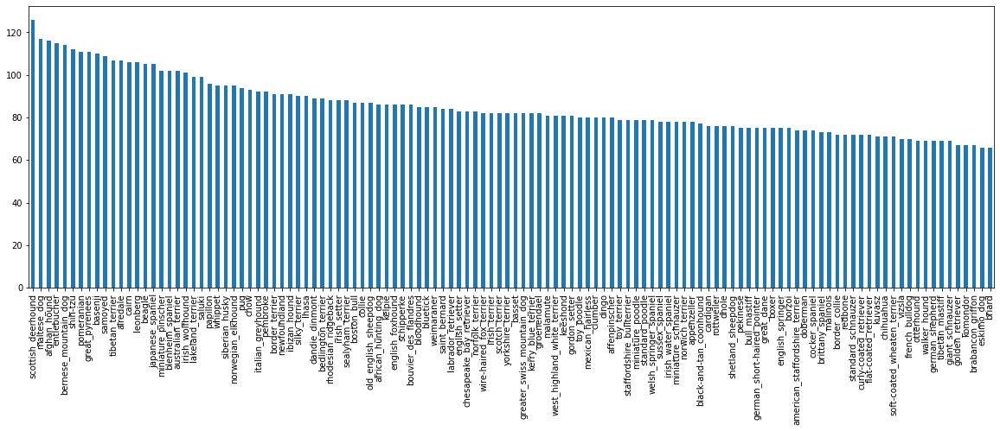

In [7]:
# Let's figure out how many images for each breed
labels_csv["breed"].value_counts().plot.bar(figsize = (20,6));

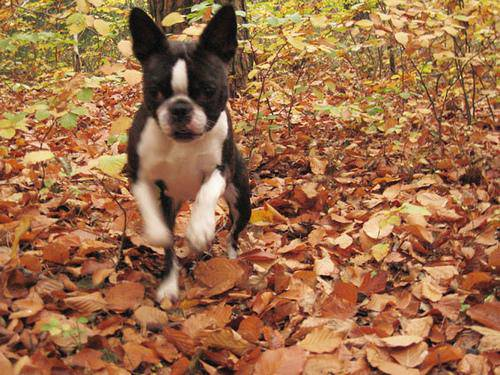

In [8]:
# Let's check one of our images 
from IPython.display import display, Image
Image("drive/MyDrive/Dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

In [9]:
labels_csv.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


Since we've got the image ID's and their labels in a DataFrame (labels_csv), we'll use it to create:

- A list a filepaths to training images
- An array of all labels
- An array of all unique labels

In [10]:
filenames = ["drive/MyDrive/Dog_vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog_vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# Check if the number of filenames equal the number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog_vision/train/")) == len(filenames):
  print("Equal")
else:
  print("Not equal")

Equal


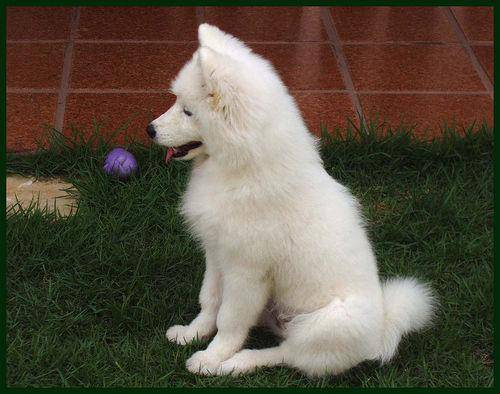

In [12]:
Image(filenames[9999])

In [13]:
# Let's get the labels (Turn breed column to numpy array )
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels.shape, labels[:10]

((10222,),
 array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
        'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
        'scottish_deerhound'], dtype=object))

In [14]:
# Find the unique label value
unique_breeds = np.unique(labels) 
len(unique_breeds)

120

In [15]:
# Turn one label to an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
# Turn all labes into a boolean array
boolean_array = [label == np.array(unique_breeds) for label in labels]
boolean_array[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

**❌ NOTE : An important concept in machine learning is converting your data to numbers before passing it to a machine learning model.**

In [17]:
# Turning a boolean array into integers 
print(labels[0])
print(np.where(labels[0] == unique_breeds)[0][0])
print(boolean_array[0].argmax())
print(boolean_array[0].astype(int))
      

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating validation set

In [18]:
 # Setup X and y
X = filenames
y = boolean_array

In [19]:
# We will use 1000 images for experimenting 
IMG = 1000
IMG

1000

In [20]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:IMG],
                                                    y[:IMG],
                                                    test_size = 0.2,
                                                    random_state = 42)

len(X_train), len(X_val)

(800, 200)

## Processing images (Turning images into tensors)

A Tensor is a way to represent information in numbers. A Tensor can be thought of as a combination of NumPy arrays, except with the special ability to be used on a GPU.

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Takes an image filename as input.
2. Uses TensorFlow to read the file and save it to a variable, image.
3. Turn our image (a jpeg file) into Tensors.
4. Resize the image to be of shape (224, 224).
5. Return the modified image.

In [21]:
# Covert image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [22]:
# Convert an image to tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [23]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read the image
  image = tf.io.read_file(image_path)
  # Turn the image into Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

### Creating data batches 
A batch (also called mini-batch) is a small portion of your data, say 32 (32 is generally the default batch size) images and their labels. In deep learning, instead of finding patterns in an entire dataset at the same time, you often find them one batch at a time.

In [24]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [25]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [26]:
# Creating training and validation data batches 
train_data = create_data_batches(X_train , y_train)
valid_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [27]:
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

### Visualizig data batches

In [28]:
import matplotlib.pyplot as plt 

def show_25_images(images, labels) :
    plt.figure(figsize = (15,10))
    for i in range(25) :
      ax = plt.subplot(5,5,i+1)
      plt.imshow(images[i]) 
      plt.title(unique_breeds[labels[i].argmax()])
      plt.axis("off")


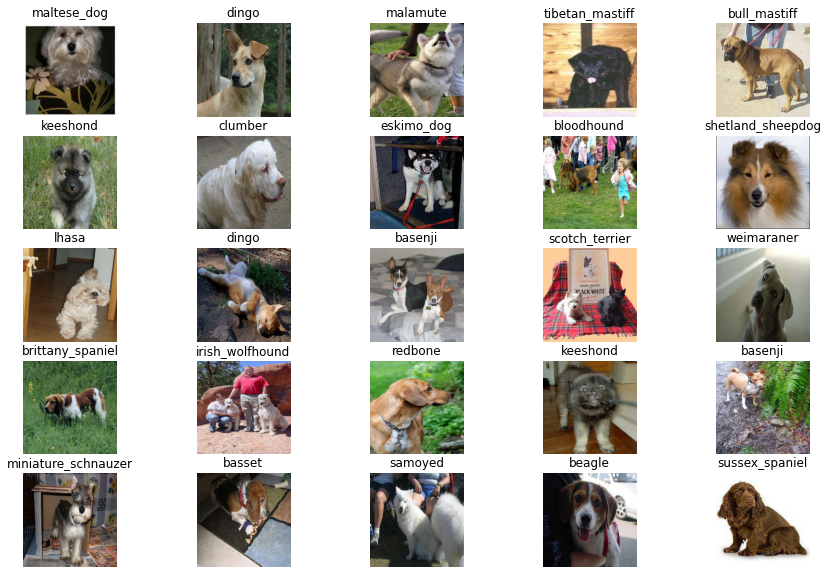

In [29]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

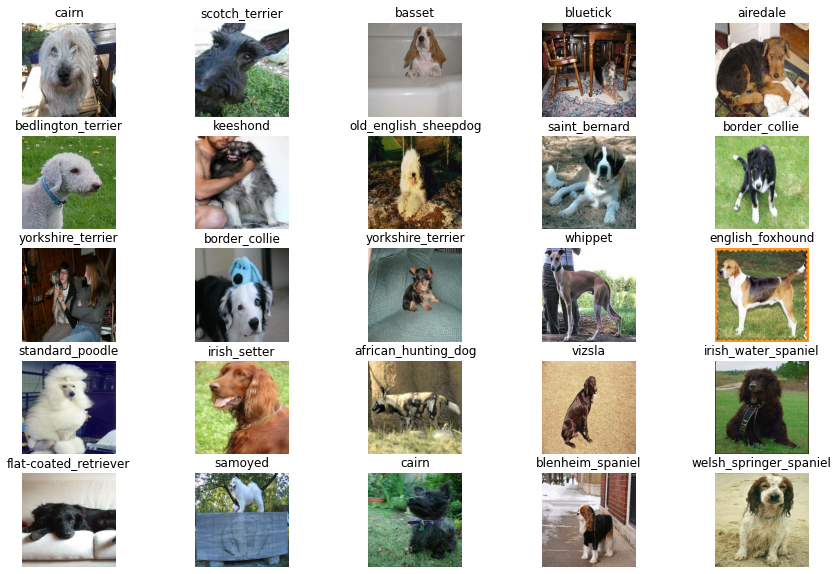

In [30]:
valid_images, valid_labels = next(valid_data.as_numpy_iterator())
show_25_images(valid_images, valid_labels)

NOTE : Every time we run show_25_images function on train_data it gives us differents images because we shuffle it

## Creating and training a model
 -  mobilenet_v2_130_224
 - we w'll work with Tensorflow hub
 - Since we know our problem is image classification (classifying different dog breeds), we can navigate the TensorFlow Hub page by our problem domain (image) https://tfhub.dev/s?module-type=image-augmentation,image-classification,image-feature-vector,image-generator,image-object-detection,image-others,image-style-transfer,image-rnn-agent
.
- We start by choosing the image problem domain, and then can filter it down by subdomains, in our case, image classification.

In [31]:
INPUT_SHAPE = [ None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

- We will use the keras API for building a model

In [32]:
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL) :
  print("START ---------- BUILDING THE MODEL")

  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), 
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax")
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), 
      optimizer=tf.keras.optimizers.Adam(),  
      metrics=["accuracy"]  
  )
    
  model.build(INPUT_SHAPE) 

  return model

In [33]:
model = create_model()

START ---------- BUILDING THE MODEL


In [34]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks 

### TensorBoard collbacks

In [35]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [36]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
Early Stopping Callback
Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before.

In [37]:
 # Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

## Training a model
- We define a parameter called "Number of epochs"
- NUM_EPOCHS defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.
- If NUM_EPOCHS = 1, the model will only look at the data once and will probably score badly because it hasn't a chance to correct itself. It would be like you competing in the international hill descent championships and your friend Adam only being able to give you 1 single instruction to get down the hill.

What's a good value for NUM_EPOCHS?

This one is hard to say. 10 could be a good start but so could 100. This is one of the reasons we created an early stopping callback. Having early stopping setup means if we set NUM_EPOCHS to 100 but our model stops improving after 22 epochs, it'll stop training

In [38]:
NUM_EPOCHS = 100

In [39]:
def train_model() : 
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x = train_data, 
            epochs = NUM_EPOCHS,
            validation_data = valid_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping]
            )
  return model


In [40]:
model = train_model()

START ---------- BUILDING THE MODEL
Epoch 1/100
25/25 [==============================] - 126s 5s/step - loss: 4.6798 - accuracy: 0.0938 - val_loss: 3.5796 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 5s 190ms/step - loss: 1.6898 - accuracy: 0.6762 - val_loss: 2.2330 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 5s 194ms/step - loss: 0.5807 - accuracy: 0.9312 - val_loss: 1.7504 - val_accuracy: 0.5600
Epoch 4/100
25/25 [==============================] - 5s 178ms/step - loss: 0.2608 - accuracy: 0.9875 - val_loss: 1.5501 - val_accuracy: 0.5850
Epoch 5/100
25/25 [==============================] - 5s 193ms/step - loss: 0.1505 - accuracy: 0.9987 - val_loss: 1.4430 - val_accuracy: 0.6300
Epoch 6/100
25/25 [==============================] - 4s 170ms/step - loss: 0.1034 - accuracy: 1.0000 - val_loss: 1.4065 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================] - 4s 171ms/step - loss: 0.0762 - accuracy: 1.0000 - val_

It looks like our model might be overfitting (getting far better results on the training set than the validation set)

### Checking the tensorboard logs 
The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and viualize its contents

In [41]:
%tensorboard --logdir drive/MyDrive/Dog_vision/logs

<IPython.core.display.Javascript object>

## Making predictions 

In [42]:
predictions = model.predict(valid_data, verbose = 1)
predictions

7/7 [==============================] - 2s 174ms/step


array([[1.3589637e-03, 8.8326757e-05, 1.9084912e-03, ..., 1.2896833e-04,
        1.4255031e-04, 4.5176055e-03],
       [1.1985364e-03, 4.1363086e-04, 1.0653575e-02, ..., 1.2190783e-03,
        3.9140075e-03, 1.9181079e-04],
       [7.0798460e-06, 4.0224670e-05, 1.5646974e-04, ..., 4.4033088e-05,
        4.1117059e-06, 3.7372409e-04],
       ...,
       [7.9881720e-06, 3.4020661e-04, 1.7075783e-04, ..., 2.4499022e-05,
        4.2615629e-05, 3.6849608e-05],
       [2.1004840e-03, 6.5916334e-05, 1.0105749e-04, ..., 1.9135888e-04,
        3.6899095e-05, 1.2323343e-02],
       [5.4028281e-04, 5.1043618e-05, 2.2099042e-04, ..., 1.2936648e-03,
        6.3229440e-04, 4.0742198e-05]], dtype=float32)

In [43]:
predictions.shape

(200, 120)

In [44]:
print(predictions[0])
print(f"Max value :{np.max(predictions[0])}")
print(f"Max index :{np.argmax(predictions[0])}")
print(f"Predicted label : {unique_breeds[np.argmax(predictions[0])]}")

[1.35896367e-03 8.83267567e-05 1.90849125e-03 2.41306407e-04
 2.34533378e-04 1.10002860e-04 1.44634377e-02 3.85556137e-04
 4.05311526e-04 1.41996052e-03 1.38896808e-04 2.24131625e-04
 8.67497234e-04 4.37125309e-05 5.52389305e-04 4.52417589e-04
 4.61687559e-05 8.85843486e-02 1.65980200e-05 8.10013735e-05
 2.11999868e-03 4.79241062e-05 1.61832504e-05 3.81499529e-03
 1.16650262e-04 3.11932556e-04 1.51163906e-01 1.42256715e-04
 6.35756762e-04 3.06866394e-04 1.37448253e-04 2.27271812e-04
 1.94127893e-03 2.56268140e-05 2.38543762e-05 8.16195458e-02
 2.36891428e-04 6.21623767e-04 6.35124961e-05 9.96236558e-05
 5.36547974e-04 2.43751147e-05 1.78894174e-04 1.34290196e-04
 7.70890892e-06 2.00664625e-04 5.32673585e-05 3.91043315e-04
 4.82188596e-04 5.00269816e-04 2.26271135e-04 5.29264253e-05
 4.99008573e-04 1.52396562e-04 2.18229412e-04 2.15525652e-05
 7.79378403e-04 1.61410938e-03 3.19845392e-04 4.67329845e-02
 9.00147832e-04 4.83376716e-05 2.58327951e-03 9.41802500e-06
 2.68760894e-04 4.907493

In [45]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'soft-coated_wheaten_terrier'

In [46]:
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
valid_images, valid_labels = unbatchify(valid_data)
valid_images[0], valid_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [47]:
def plot_pred(pred_probabilities, labels, images,n = 1 ) : 
  pred = pred_probabilities[n]
  true_label = labels[n]
  image = images[n]

  pred_label = get_pred_label(pred)
  plt.imshow(image)

  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred)*100,
                                      true_label),
                                      color=color)
                 

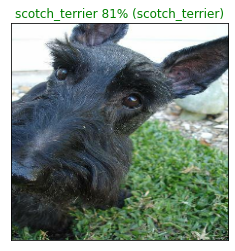

In [48]:
plot_pred(pred_probabilities=predictions,
          labels=valid_labels,
          images=valid_images)

In [49]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

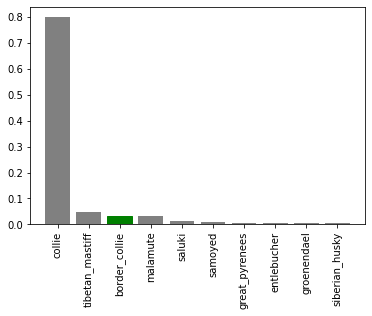

In [50]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=valid_labels,
               n=9)

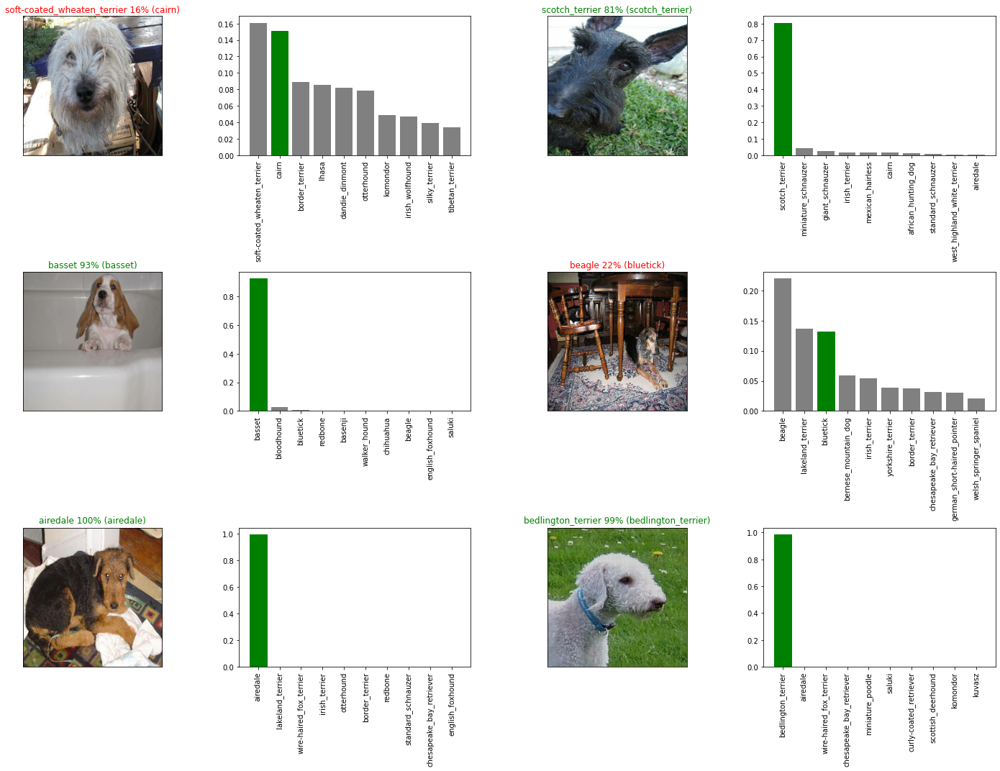

In [52]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(pred_probabilities=predictions,
            labels=valid_labels,
            images=valid_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=valid_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving the model

In [56]:
# Function that save our model
def save_model(model, suffix = None) : 
  modeldir = os.path.join("drive/MyDrive/Dog_vision/models", 
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [57]:
# Function that load our model
def load_model(model_path): 
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [58]:
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/MyDrive/Dog_vision/models/20211126-16021637942566-1000-images-Adam.h5...


'drive/MyDrive/Dog_vision/models/20211126-16021637942566-1000-images-Adam.h5'

In [61]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/MyDrive/Dog_vision/models/20211126-16021637942566-1000-images-Adam.h5')

Loading saved model from: drive/MyDrive/Dog_vision/models/20211126-16021637942566-1000-images-Adam.h5


In [62]:
model.evaluate(valid_data)

7/7 [==============================] - 1s 113ms/step - loss: 1.2728 - accuracy: 0.6600


[1.2728030681610107, 0.6600000262260437]

In [63]:
model_1000_images.evaluate(valid_data)

7/7 [==============================] - 2s 112ms/step - loss: 1.2728 - accuracy: 0.6600


[1.2728030681610107, 0.6600000262260437]